In [1]:
import os
from pathlib import Path
from dotenv import load_dotenv, find_dotenv

load_dotenv(find_dotenv())

model_name = os.getenv("MODEL_NAME") or "gpt-4o-mini"
model_provider = os.getenv("MODEL_PROVIDER") or "openai"

import chromadb
import base64

from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction
from chromadb.utils.data_loaders import ImageLoader
from datasets import load_dataset
from langchain_openai import ChatOpenAI
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.output_parsers import StrOutputParser


In [2]:
SCRIPT_DIR = os.path.dirname(os.path.abspath(Path.cwd()))
SCRIPT_DIR


'/Users/jurepi/Work/Study/jo-langchain'

In [3]:
Path.cwd()

PosixPath('/Users/jurepi/Work/Study/jo-langchain/ch15')

In [4]:
os.path.abspath(Path.cwd())

'/Users/jurepi/Work/Study/jo-langchain/ch15'

In [5]:
os.path.join(SCRIPT_DIR, "data", "fashionpedia")

'/Users/jurepi/Work/Study/jo-langchain/data/fashionpedia'

In [6]:
def setup_dataset():
    dataset = load_dataset("detection-datasets/fashionpedia")
    dataset_folder = os.path.join(SCRIPT_DIR, 'data', 'fashionpedia')
    os.makedirs(dataset_folder, exist_ok=True)
    return dataset, dataset_folder

In [7]:
def save_images(dataset, dataset_folder, num_images=500):
    for i in range(num_images):
        image = dataset['train'][i]['image']
        image.save(os.path.join(dataset_folder, f'image_{i+1}.png'))

    print(f"Saved {num_images} images to {dataset_folder}")

In [8]:
def setup_chroma_db():
    vdb_path = os.path.join(SCRIPT_DIR, 'index', 'img_vdb')

    chroma_client = chromadb.PersistentClient(path=vdb_path)
    image_loader = ImageLoader()
    CLIP = OpenCLIPEmbeddingFunction()

    image_vdb = chroma_client.get_or_create_collection(
        name="image",
        embedding_function=CLIP,
        data_loader=image_loader,
    )

    return image_vdb


In [9]:
def add_images_to_db(image_vdb, dataset_folder):
    ids = []
    uris = []
    for i, filename in enumerate(sorted(os.listdir(dataset_folder))):
        file_path = os.path.join(dataset_folder, filename)
        ids.append(str(i))
        uris.append(file_path)

    image_vdb.add(ids=ids, uris=uris)
    print("이미지가 데이터베이스에 추가되었습니다.")

In [40]:

def query_db(image_vdb, query, results=2):
    return image_vdb.query(
        query_texts=[query],
        n_results=results,
        include=['uris', 'distances']
    )
    
from IPython.display import display
from PIL import Image

def print_results(results):
    # print('--------'*10)
    # print(results)
    # print('--------'*10)

    for idx, uri in enumerate(results['uris'][0]):
        print(f"ID: {results['ids'][0][idx]}")
        print(f"Distance: {results['distances'][0][idx]}")
        print(f"Path: {uri}")

        # 이미지 표시
        image = Image.open(uri)
        display(image)

        print('\n')



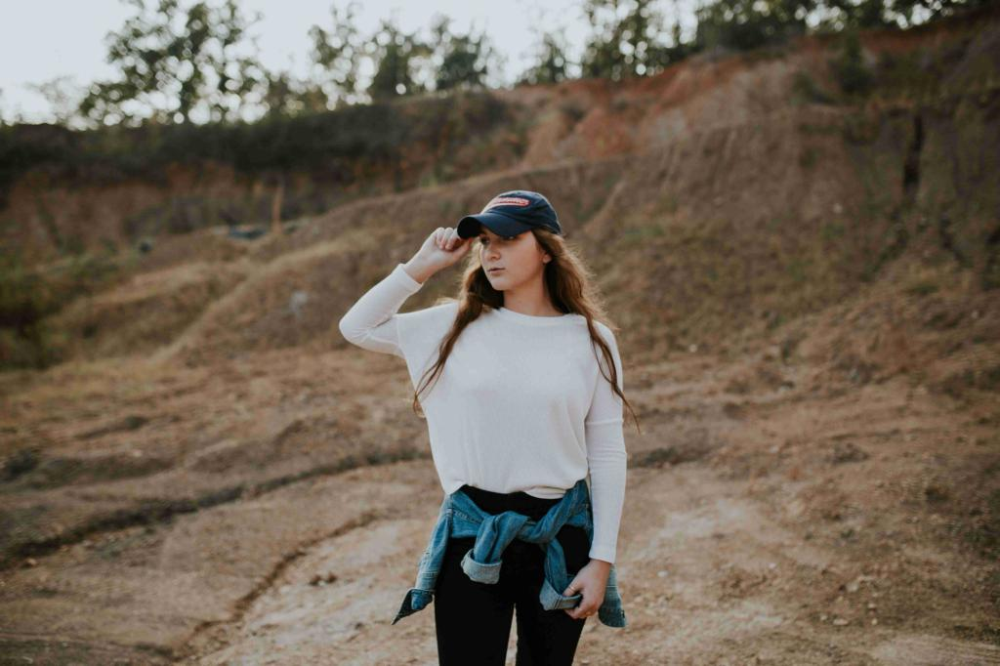

In [38]:
from IPython.display import display
from PIL import Image

temp_image_path = '/Users/jurepi/Work/Study/jo-langchain/data/fashionpedia/image_454.png'
image = Image.open(temp_image_path)

display(image)

In [11]:
def translate(text, target_lang):

    translation_model = ChatOpenAI(
        model="gpt-3.5-turbo",
        temperature=0,
    )
    translation_prompt = ChatPromptTemplate.from_messages([
        ("system", f"You are a translator Translate the following text to {target_lang}"),
        ("user", "{text}")
    ])

    # print(text, target_lang)
    translation_chain = translation_prompt | translation_model | StrOutputParser()
    return translation_chain.invoke({"text": text})

def get_image_from_db(image_vdb, ids):
    results = image_vdb.get(ids=ids, include=['documents', 'metadatas'])
    return results['documents'][0], results['metadatas'][0]['path']
    

In [12]:
# query_ko = "하늘색 계역의 캐주얼한 여름 코드 추천해줘"
# translate(query_ko, 'English')

In [13]:
def setup_vision_chain():
    gpt4 = ChatOpenAI(
        model="gpt-4o-mini",
        temperature=0,
    )
    parser = StrOutputParser()
    image_prompt = ChatPromptTemplate.from_messages([
        (
            "system", """You are a helpful fashion and styling assistant. 
            Answer the user's question using the given image context with direct references to parts of the images provided.
            Maintain a more conversational tone, don't make too many list. Use markdown formatting for hightlights, emphasis, and structure"""
        ),
        ("user", 
            [
                {
                    "type": "text",
                    "text": "What are some ideas for styling {user_query}"
                },
                {
                    "type": "image_url",
                    "image_url": "data:image/jpeg;base64,{image_data_1}"
                },
                {
                    "type": "image_url",
                    "image_url": "data:image/jpeg;base64,{image_data_2}"
                }
            ]
        )
    ])
    
    return image_prompt | gpt4 | parser



In [14]:
def format_prompt_inputs(data, user_query):
    inputs = {}
    inputs['user_query'] = user_query

    # print(inputs)

    image_path_1 = data['uris'][0][0]
    image_path_2 = data['uris'][0][1]

    # print(image_path_1, image_path_2)
    with open(image_path_1, 'rb') as image_file:
        image_data_1 = image_file.read()
    inputs['image_data_1'] = base64.b64encode(image_data_1).decode('utf-8')
        
    with open(image_path_2, 'rb') as image_file:
        image_data_2 = image_file.read()
    inputs['image_data_2'] = base64.b64encode(image_data_2).decode('utf-8')

    #print(inputs)
    return inputs

In [15]:
def main():
    dataset_folder = os.path.join(SCRIPT_DIR, "data", "fashionpedia")
    if not os.path.exists(dataset_folder) or not any(fname.endswith('.png') for fname in os.listdir(dataset_folder)):
        dataset, dataset_folder = setup_dataset()
        save_images(dataset, dataset_folder)
    else:
        print("데이터셋 폴더와 이미지가 이미 존재합니다. 데이터셋 설정을 건너뜁니다.)")
    

In [16]:
dataset_folder = os.path.join(SCRIPT_DIR, "data", "fashionpedia")
vdb_path = os.path.join(SCRIPT_DIR, 'index', 'img_vdb')
if not os.path.exists(vdb_path) or not os.listdir(vdb_path):
    image_vdb = setup_chroma_db()
    add_images_to_db(image_vdb, dataset_folder)
else:
    print("벡터 데이터베이스가 이미 설정되어 있습니다. 데이터베이스 설정을 건너뜁니다.")
    image_vdb = setup_chroma_db()


벡터 데이터베이스가 이미 설정되어 있습니다. 데이터베이스 설정을 건너뜁니다.


In [17]:
vision_chain = setup_vision_chain()

In [18]:
print("image_vdb", type(image_vdb))

# image_vdb의 전체 개수
print("image_vdb의 전체 개수: ", image_vdb.count())



image_vdb <class 'chromadb.api.models.Collection.Collection'>
image_vdb의 전체 개수:  500



FashionRAG가 여러분의 서비스를 위해 준비되었습니다.!
오늘 어떤 스타일에 대해 조언을 받고 싶으신가요? (종료하려면 'quit' 입력)

검색된 이미지: 
ID: 349
Distance: 0.7497496604919434
Path: /Users/jurepi/Work/Study/jo-langchain/data/fashionpedia/image_413.png


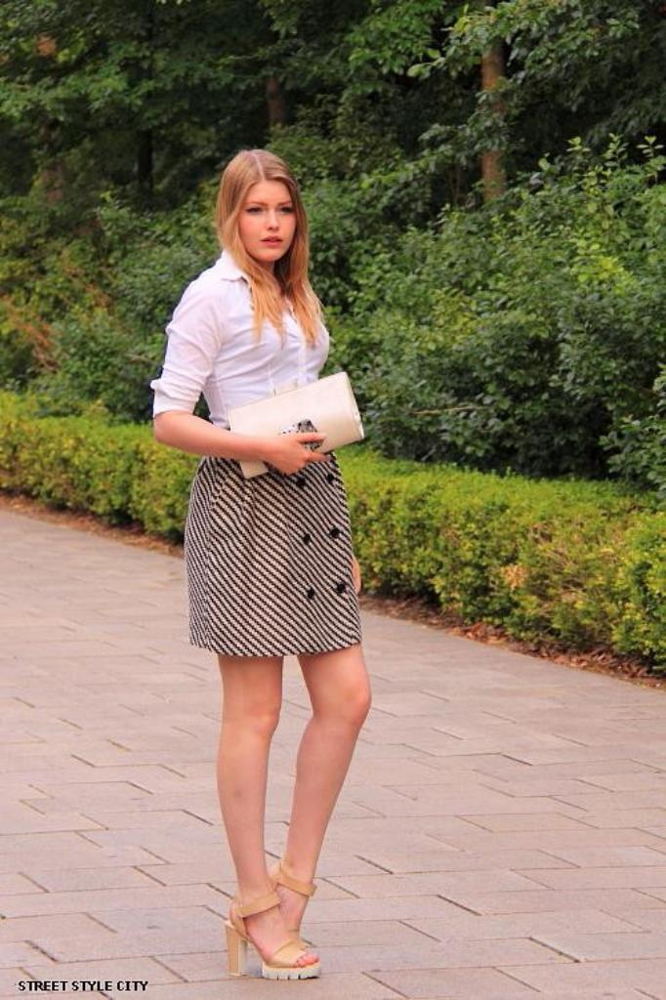



ID: 394
Distance: 0.7544726133346558
Path: /Users/jurepi/Work/Study/jo-langchain/data/fashionpedia/image_454.png


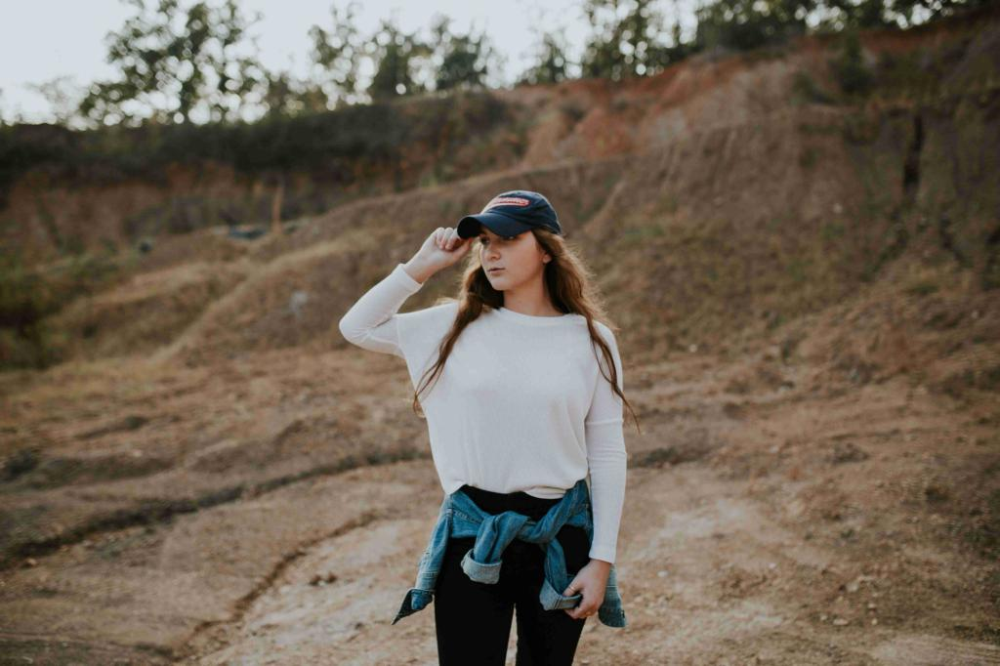




FashionRAG의 응답: 
골프 코스에서 스타일링할 때는 편안함과 기능성이 중요하지만 여전히 세련된 모습을 유지할 수 있습니다! 여기에는 제공된 이미지에서 영감을 받은 몇 가지 의상 아이디어가 있습니다:

### 골프용 의상 아이디어

1. **클래식 폴로와 반바지**:
   - **상의**: 통기성 있는 원단으로 만든 핏된 폴로 셔츠. 시원하게 유지하려면 밝은 색상을 선택하세요.
   - **하의**: 움직임이 자유로운 테일러드 골프 반바지. 수분 흡수 소재를 찾아보세요.
   - **신발**: 좋은 그립감이 있는 편안한 골프화.

2. **운동복 스타일**:
   - **드레스**: 스타일과 기능성을 결합한 스포티한 골프 드레스. 티와 공을 넣을 수 있는 포켓이 있는 것을 찾아보세요.
   - **액세서리**: 태양으로부터 얼굴을 가리는 바이저나 모자.
   - **신발**: 가벼운 스니커즈나 골프화.

3. **레이어드 룩**:
   - **상의**: 햇빛 차단을 위한 수분 흡수 소재의 긴 소매 셔츠 (두 번째 이미지의 것과 같은).
   - **레이어**: 조금 서늘하다면 가벼운 재킷이나 소매 없는 조끼.
   - **하의**: 신축성이 좋고 편안한 카프리나 골프 바지.
   - **액세서리**: 태양을 가리기 위한 베이스볼 모자.

4. **치마와 상의 조합**:
   - **상의**: 핏된 탱크 탑이나 반팔 셔츠.
   - **하의**: 편안함을 더하기 위해 내장된 반바지가 있는 골프 치마.
   - **신발**: 세련되면서도 기능적인 골프화.

### 추가 팁
- **원단 선택**: 통기성이 좋고 수분 흡수가 잘되는 원단을 찾아서 시원하고 건조하게 유지하세요.
- **색상**: 밝은 색상은 햇빛을 반사하고, 어두운 색상은 열을 흡수할 수 있습니다.
- **액세서리**: 선글라스와 좋은 선크림을 잊지 마세요!

이러한 아이디어로 멋진 모습을 유지하면서 게임을 즐길 수 있습니다!

FashionRAG가 여러분의 서비스를 위해 준비되었습니다.!

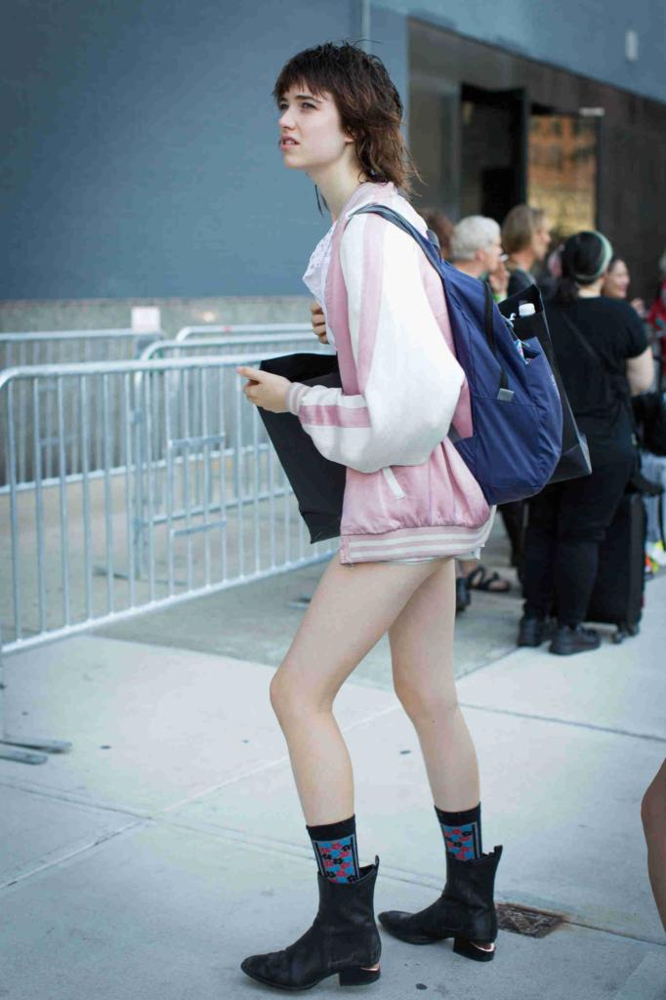



ID: 350
Distance: 0.7660457491874695
Path: /Users/jurepi/Work/Study/jo-langchain/data/fashionpedia/image_414.png


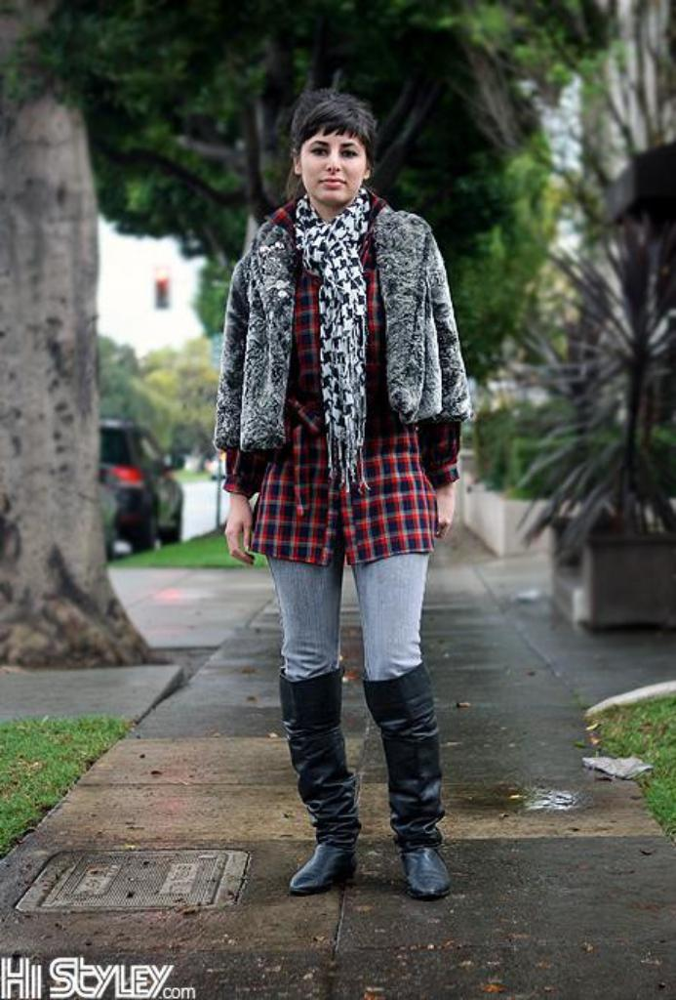




FashionRAG의 응답: 
어린이 상담 환경에서 스타일링할 때는 전문성과 친근성 사이의 균형을 유지하는 것이 중요합니다. 여기에는 제공해주신 이미지에서 영감을 받은 몇 가지 아이디어가 있습니다:

### 의상 아이디어

1. **캐주얼하면서도 세련된**:
   - **레이어링**: 첫 번째 이미지의 핑크색 폭탄자켓과 비슷한 가벼우면서 편안한 재킷을 고려해보세요. 이것은 여전히 단정하게 보이면서도 편안한 느낌을 줍니다.
   - **하의**: 맞춤형 청바지나 치노를 선택하세요. 편안함과 깔끔한 외모를 제공하여 아이들과 상호작용하는 동안 움직이기 쉽게 만들어줍니다.

2. **질감 있는 레이어**:
   - 두 번째 이미지에는 아늑한 인조 모피 재킷이 특징입니다. 이것은 쌀쌀한 날씨에 좋은 추가물이 될 수 있으며 따뜻하고 초대하는 느낌을 줍니다. 친근한 외모를 위해 간단한 체크 셔츠와 함께 매치하세요.
   - **신발**: 발목 부츠나 세련된 스니커즈를 선택하세요. 걷기에 편안하면서도 세련된 느낌이어야 합니다.

3. **재미있는 액세서리**:
   - 두 번째 이미지의 것처럼 재미있는 양말이나 컬러풀한 스카프를 활용하세요. 이것은 개성을 더해주고 아이들과의 대화 시작을 도울 수 있습니다.

### 컬러 팔레트
- **부드럽고 중립적인 톤**: 파스텔이나 어스톤과 같은 부드러운 색상을 유지하세요. 진정하고 친근한 느낌을 줍니다.
- **색의 강조**: 액세서리나 작은 디테일을 사용하여 의상을 압도하지 않고 컬러를 더해보세요.

### 전체적인 분위기
**친근하고 친절한** 느낌을 추구하세요. 아이들에게 환영받는 분위기를 조성하고자 하므로, 편안함과 스타일은 함께 가야 합니다.

이러한 요소들을 혼합하여 자신만의 정통한 룩을 만들어보세요!

FashionRAG가 여러분의 서비스를 위해 준비되었습니다.!
오늘 어떤 스타일에 대해 조언을 받고 싶으신가요? (종료하려면 'quit' 입력)

검색된 이미지: 
ID: 466
Distance: 0.690808355

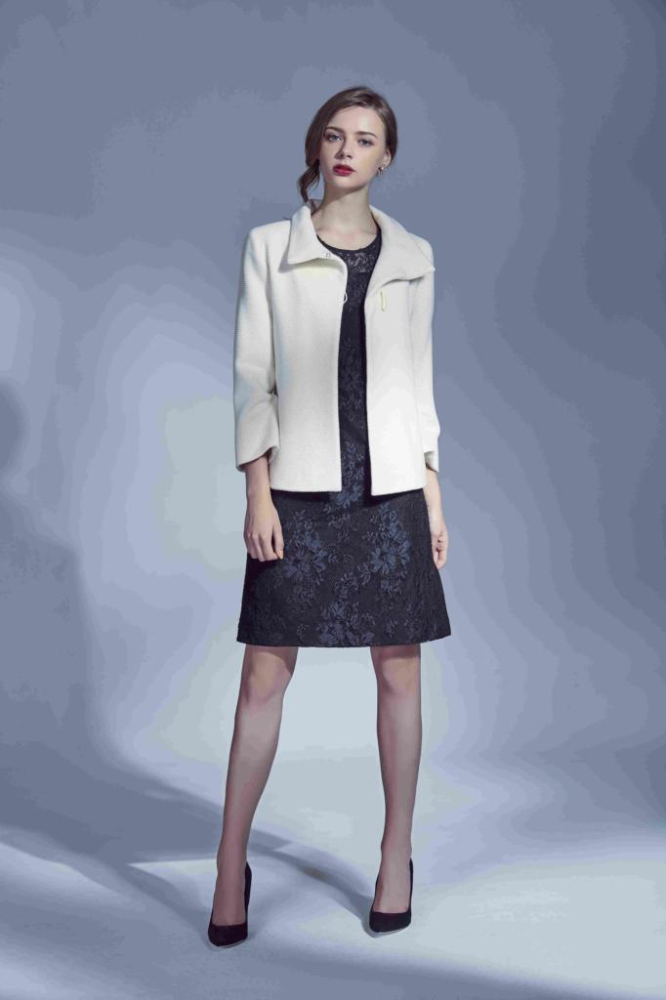



ID: 349
Distance: 0.7090387940406799
Path: /Users/jurepi/Work/Study/jo-langchain/data/fashionpedia/image_413.png


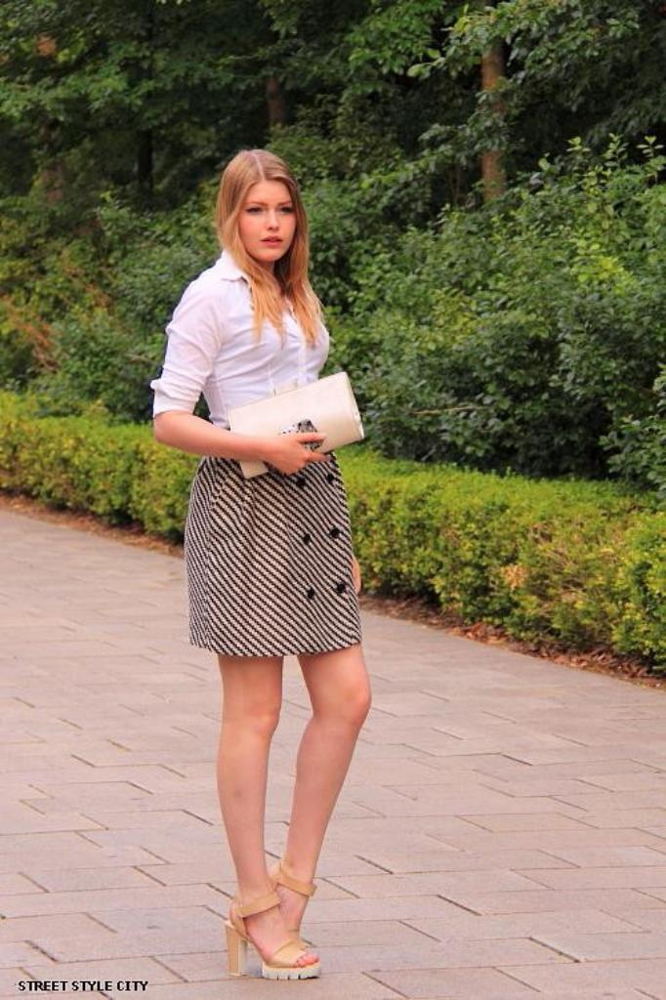




FashionRAG의 응답: 
면접에서 신뢰감을 전달하는 의상을 스타일링할 때, 공유한 두 가지 의상 모두 고려할만한 좋은 요소들이 있습니다. 이미지를 기반으로 한 몇 가지 아이디어를 소개해 드리겠습니다:

### 의상 1: 우아하고 전문적인
- **색상 팔레트**: **흰색 자켓** 위에 **검은색 드레스**를 입는 것은 클래식하고 전문적인 룩을 만들어냅니다. 흰색은 순수함과 신뢰를 상징하며, 검은색은 권위감을 더합니다.
- **핏과 구조**: 구조적인 자켓은 세련된 외모를 선사해 면접관에게 자신감을 심어줄 수 있습니다. 실루엣을 강조하기 위해 테일러드 핏을 선택하세요.
- **액세서리**: 액세서리는 최소한으로 유지하세요. 간단한 **스터드 귀걸이**나 클래식한 시계는 주의를 분산시키지 않으면서 우아함을 더할 수 있습니다.
- **신발**: **검은색 하이힐**은 다리를 길게 보이게 해주고 전문적인 분위기를 유지하는 좋은 선택입니다. 걸을 때 편안하도록 확인하세요.

### 의상 2: 스마트 캐주얼
- **상의 선택**: **흰색 버튼업 셔츠**는 전문성을 전달하는 시대를 초월한 아이템입니다. **줄무늬 스커트**와 매치하면 현대적인 요소를 더하면서 세련되게 유지할 수 있습니다.
- **색상과 패턴**: 흰색과 검은색 줄무늬의 조합은 시각적으로 매력적이면서도 안정감이 있습니다. 줄무늬는 자신감과 역동성을 시사할 수도 있습니다.
- **액세서리**: **중립적인 클러치**는 기능적이면서 의상에 집중할 수 있게 도와줍니다. 간단한 팔찌나 반지도 고려해 볼 수 있습니다.
- **신발**: **누드 하이힐**은 다리를 길어 보이게 해주고 다양한 의상과 잘 어울리는 좋은 선택입니다.

### 일반적인 팁:
- **그루밍**: 머리카락을 정돈하고 메이크업은 자연스럽게 하여 특징을 강조하되 너무 강조하지 않도록 합니다.
- **자신감**: 선택한 의상을 자신 있게 입으세요. 태도는 당신이 얼마나 신뢰할 만한지에 상당한 영향을 줄 수 있습니다.

두 의상에서 요소를

In [41]:
while True:
    print("\nFashionRAG가 여러분의 서비스를 위해 준비되었습니다.!")
    print("오늘 어떤 스타일에 대해 조언을 받고 싶으신가요? (종료하려면 'quit' 입력)")
    query_ko = input("\n질문을 입력하세요: ")

    if query_ko.lower() == 'quit':
        break

    query_en = translate(query_ko, 'English')
    results = query_db(image_vdb, query_en, results=2)
    # print(results)
    
    prompt_input = format_prompt_inputs(results, query_en)
    # print(prompt_input)

    response_en = vision_chain.invoke(prompt_input)
    response_ko = translate(response_en, 'Korean')

    print(f"\n검색된 이미지: ")

    print_results(results)

    print("\nFashionRAG의 응답: ")
    print(response_ko)




In [20]:
if __name__ == "__main__":
    main()



데이터셋 폴더와 이미지가 이미 존재합니다. 데이터셋 설정을 건너뜁니다.)
